In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
datafile="C:/Users/yashp/OneDrive/Desktop/Project/train/good"

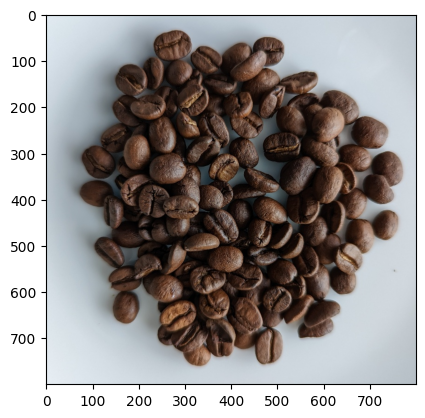

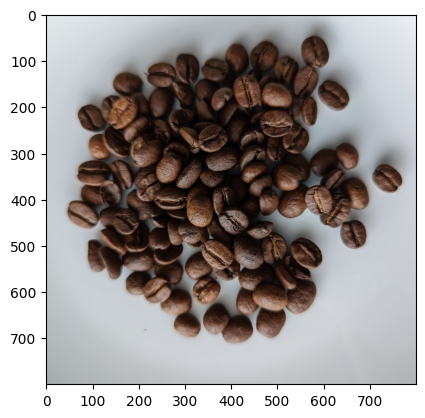

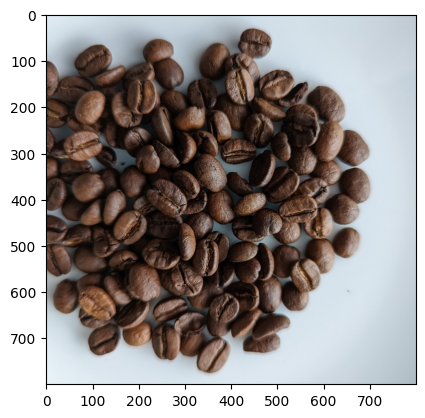

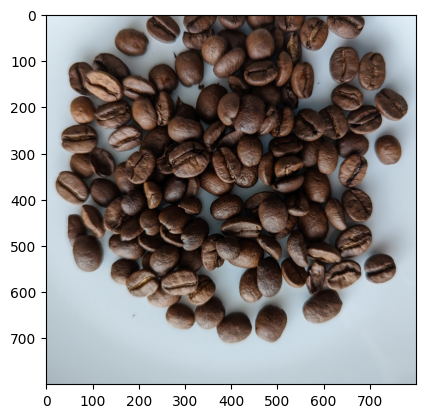

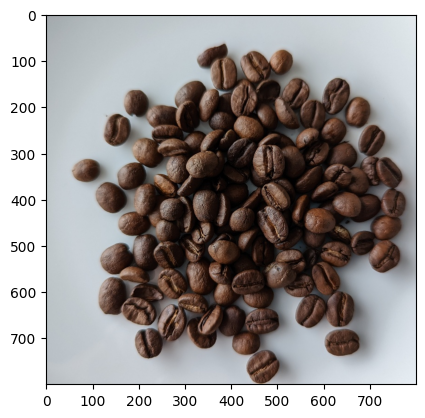

...

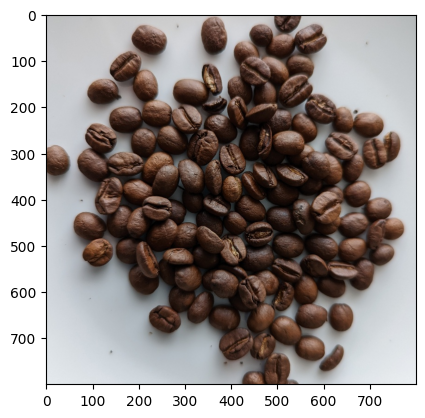

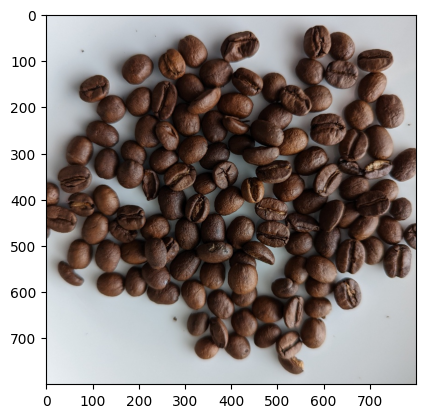

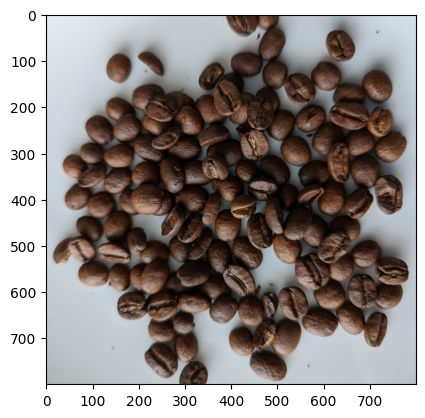

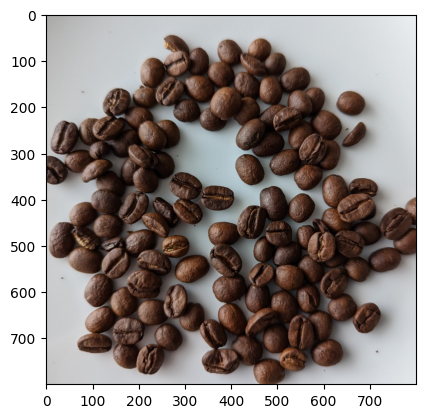

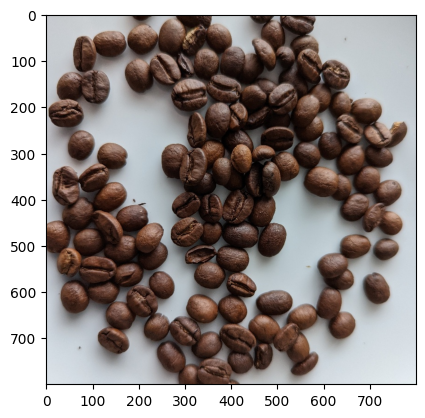

In [3]:
for file in os.listdir(datafile):
    img_path = os.path.join(datafile, file)
    with Image.open(img_path) as img:
        plt.imshow(img)
        plt.show()

In [5]:
files = os.listdir(datafile)

In [6]:
x_train = []
for file in files:
    image = Image.open(os.path.join(datafile, file))
    # Resize the image to a standard size (e.g., 256x256)
    image = image.resize((256, 256))
    # Convert the image to a numpy array
    image = np.asarray(image)
    x_train.append(image)
x_train = np.array(x_train)

In [7]:
input_img = keras.Input(shape=(256, 256, 3))
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input_img)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
encoded = layers.MaxPooling2D((2, 2), padding="same")(x)

x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(encoded)
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
decoded = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

autoencoder = keras.Model(input_img, decoded)

In [8]:
autoencoder.compile(optimizer="adam", loss="mse")
autoencoder.fit(x_train, x_train, epochs=50, batch_size=32)

Epoch 1/50
2/2 [==============================] - 10s 2s/step - loss: 19363.9336
Epoch 2/50
2/2 [==============================] - 0s 126ms/step - loss: 19325.9668
Epoch 3/50
2/2 [==============================] - 0s 139ms/step - loss: 19309.9258
Epoch 4/50
2/2 [==============================] - 0s 134ms/step - loss: 19303.5078
Epoch 5/50
2/2 [==============================] - 0s 131ms/step - loss: 19302.3887
Epoch 6/50
2/2 [==============================] - 0s 121ms/step - loss: 19298.1016
Epoch 7/50
2/2 [==============================] - 0s 132ms/step - loss: 19294.0273
Epoch 8/50
2/2 [==============================] - 0s 117ms/step - loss: 19293.8457
Epoch 9/50
2/2 [==============================] - 0s 128ms/step - loss: 19293.8379
Epoch 10/50
2/2 [==============================] - 0s 119ms/step - loss: 19293.8359
Epoch 11/50
2/2 [==============================] - 0s 128ms/step - loss: 19293.8340
Epoch 12/50
2/2 [==============================] - 0s 139ms/step - loss: 19293.8320
Epo

In [10]:
test_dir="C:/Users/yashp/OneDrive/Desktop/Project/test/good/"

In [11]:
test_files = os.listdir(test_dir)

In [12]:
x_test = []
for file in test_files:
    image = Image.open(os.path.join(test_dir, file))
    # Resize the image to a standard size (e.g., 256x256)
    image = image.resize((256, 256))
    # Convert the image to a numpy array
    image = np.asarray(image)
    x_test.append(image)
x_test = np.array(x_test)

# Use the trained autoencoder to reconstruct the test images
reconstructed_images = autoencoder.predict(x_test)

In [13]:
mse = np.mean(np.power(x_test - reconstructed_images, 2), axis=(1, 2, 3))

In [14]:
threshold = np.percentile(mse, 95)
anomalies = np.where(mse > threshold)[0]